# Week 21 - Progress Log


=== Processing: Twin Lake East_tax_mass ===


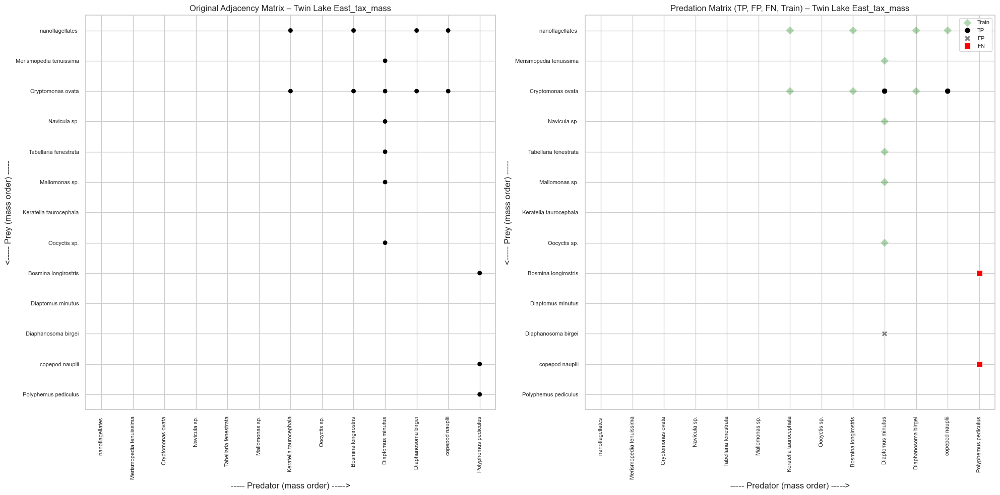


=== Processing: Brook trout lake_tax_mass ===


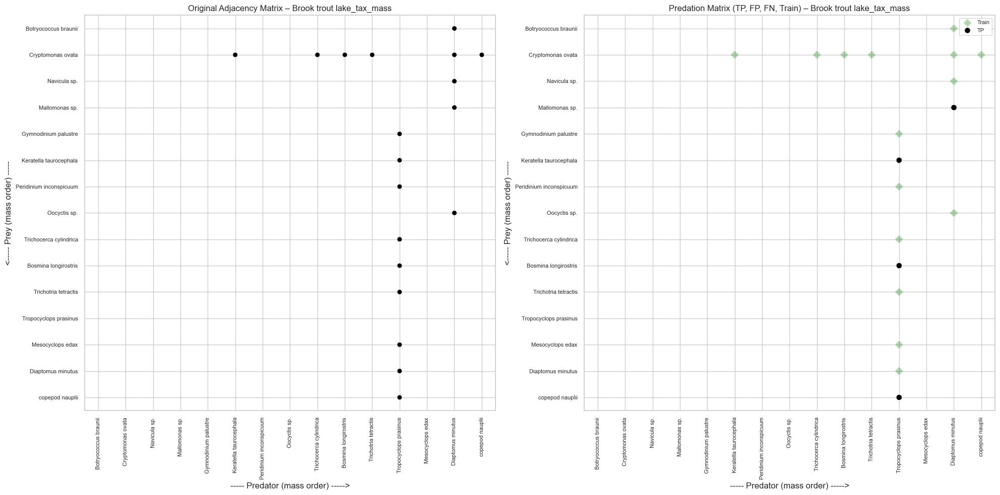


=== Processing: SF2M2_tax_mass ===


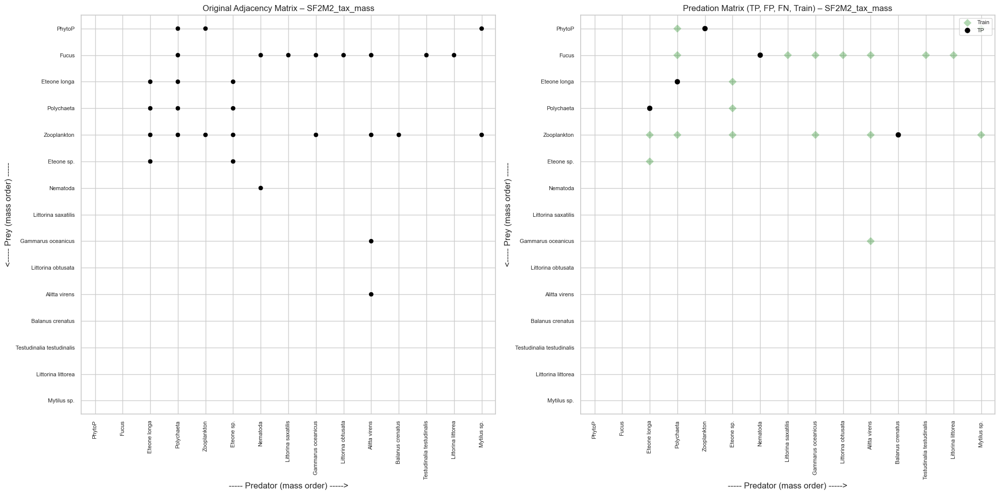


=== Processing: CGP1_tax_mass ===


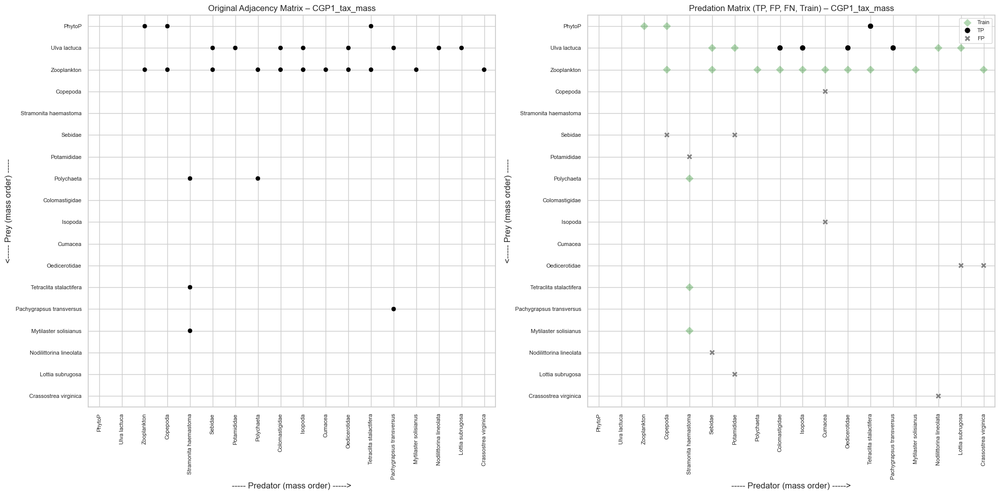


=== Processing: SF1I2_tax_mass ===


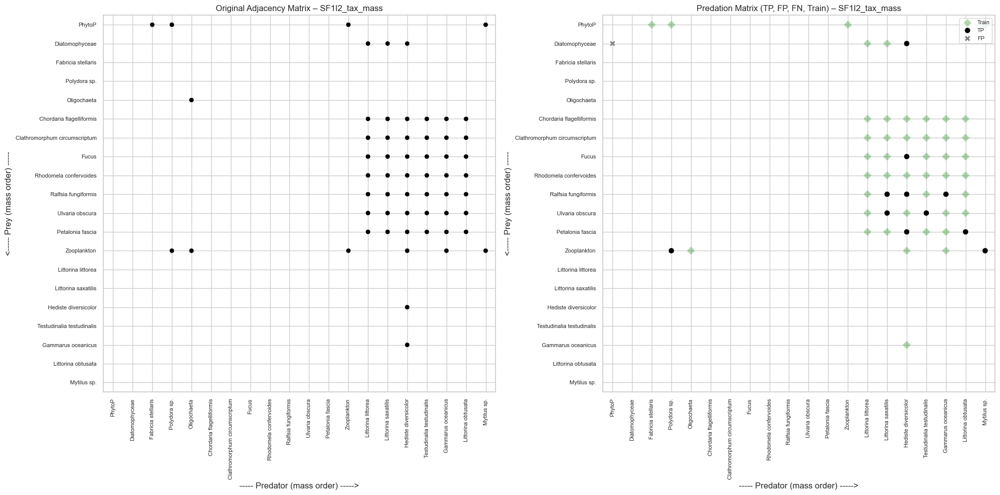


=== Processing: PGUBP3_tax_mass ===


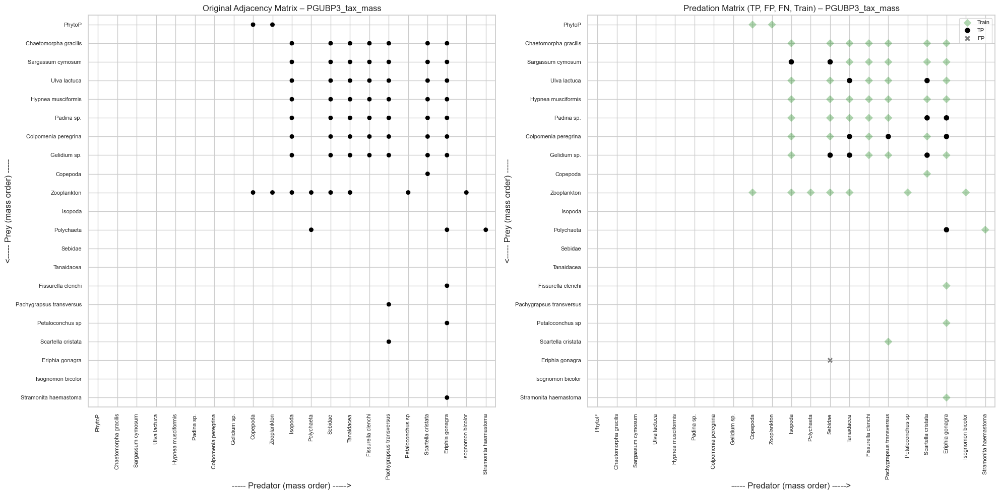


=== Processing: SF1I4_tax_mass ===


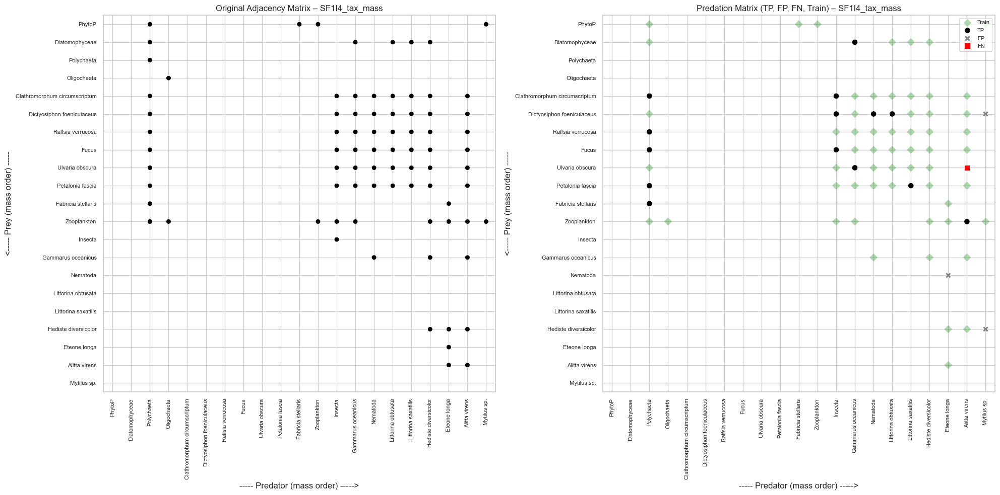


=== Processing: PP1I1_tax_mass ===


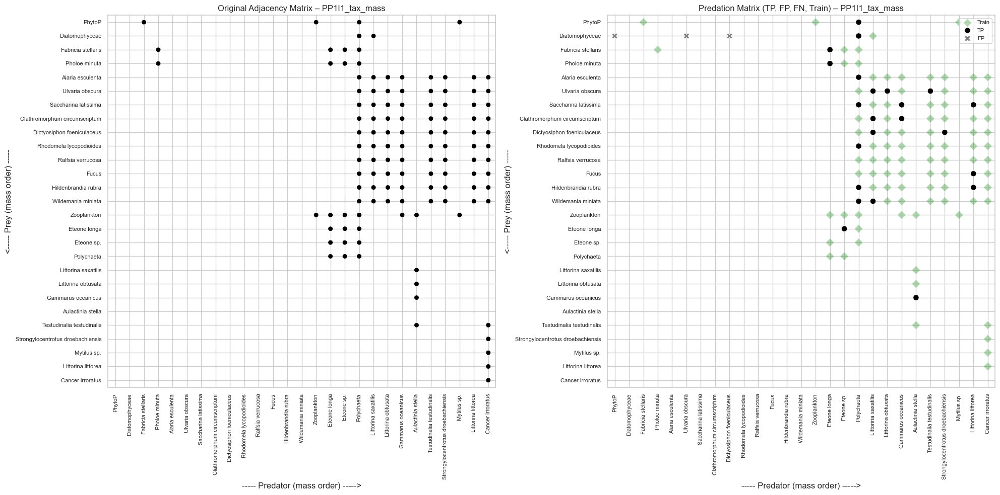


=== Processing: WP4_tax_mass ===


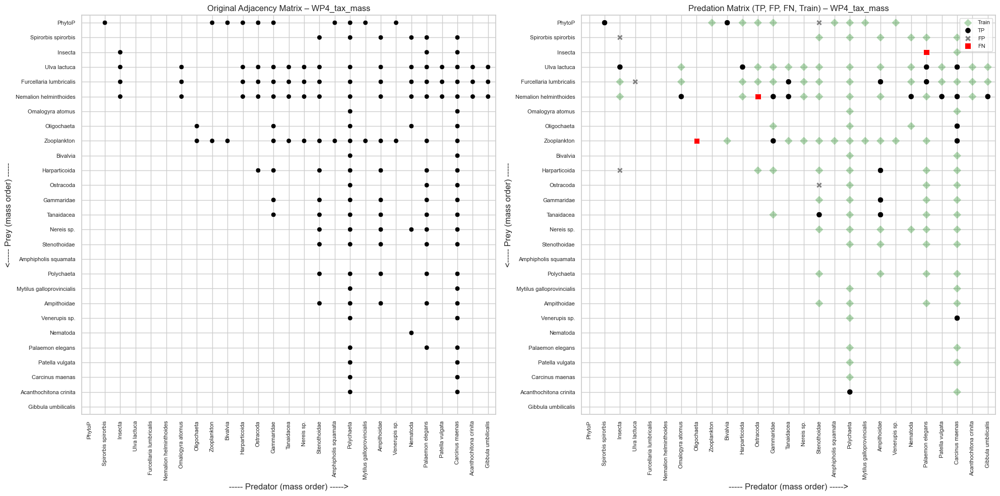


=== Processing: GJBP3_tax_mass ===


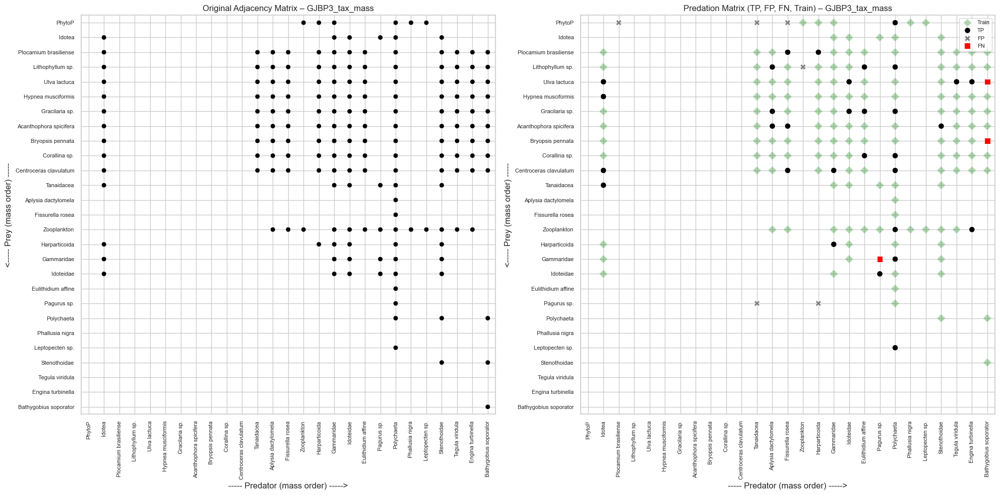


=== Processing: CGP3_tax_mass ===


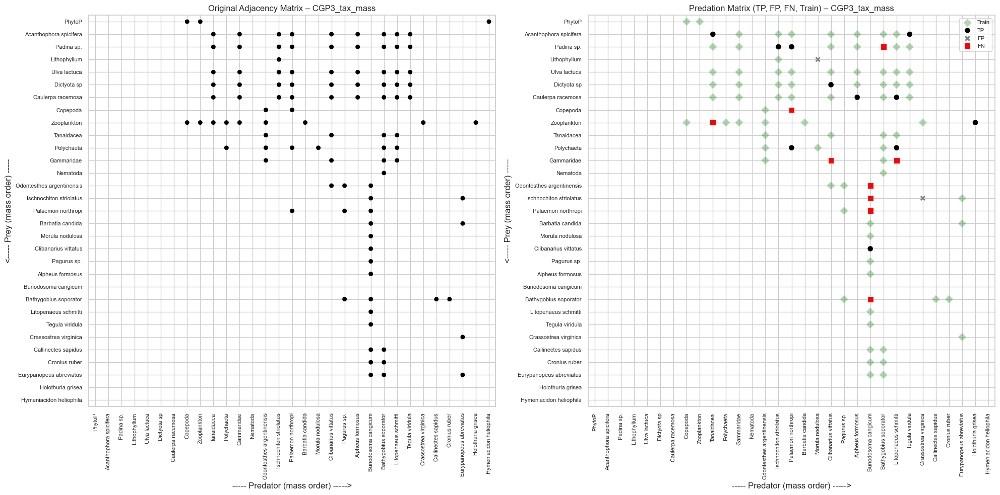


=== Processing: Fawn lake_tax_mass ===


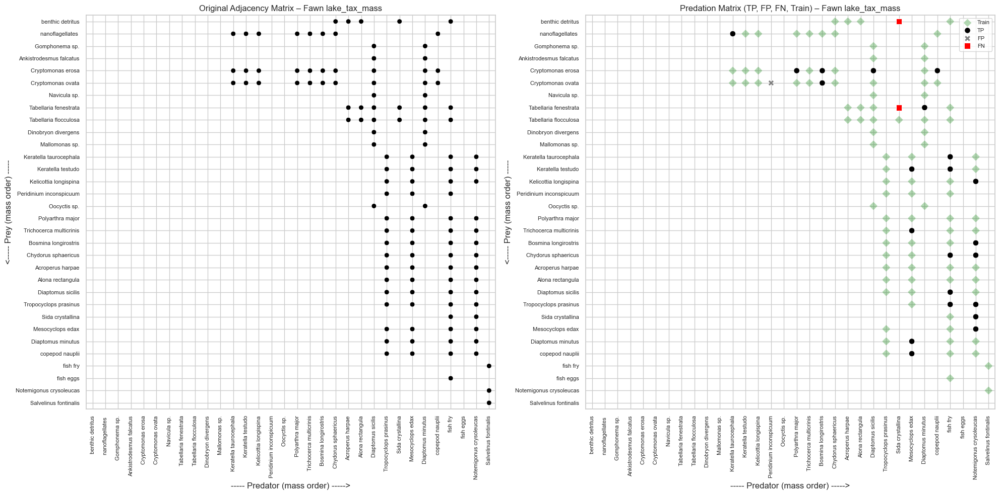


=== Processing: MBP1_tax_mass ===


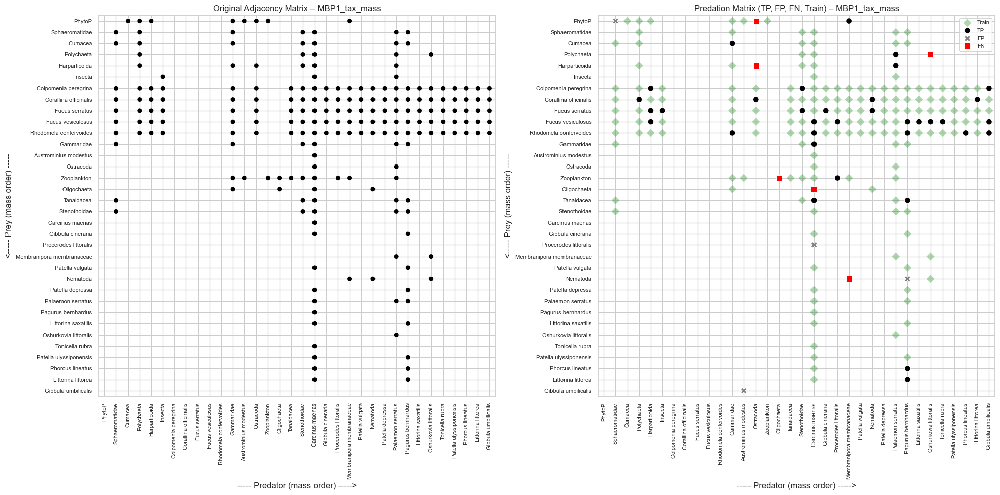


=== Processing: Indian Lake_tax_mass ===


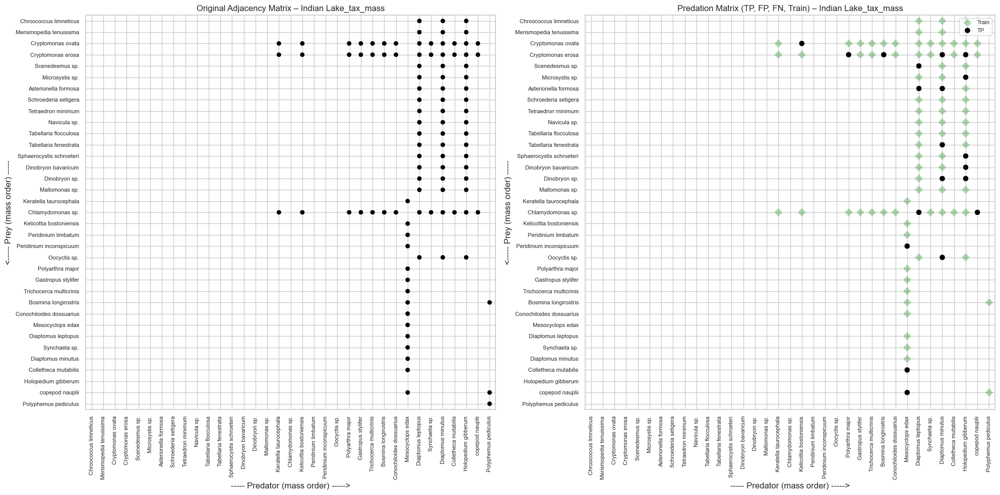


=== Processing: MBP3_tax_mass ===


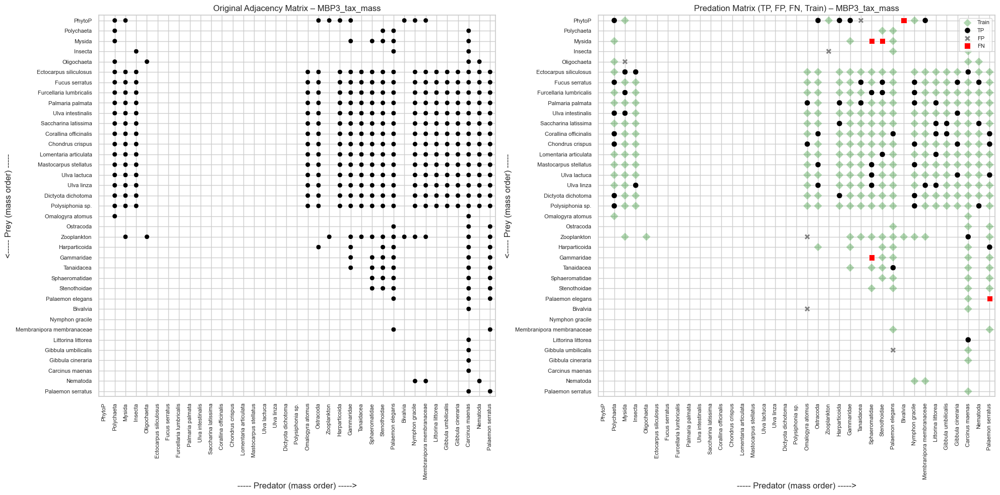


=== Processing: L4P3_tax_mass ===


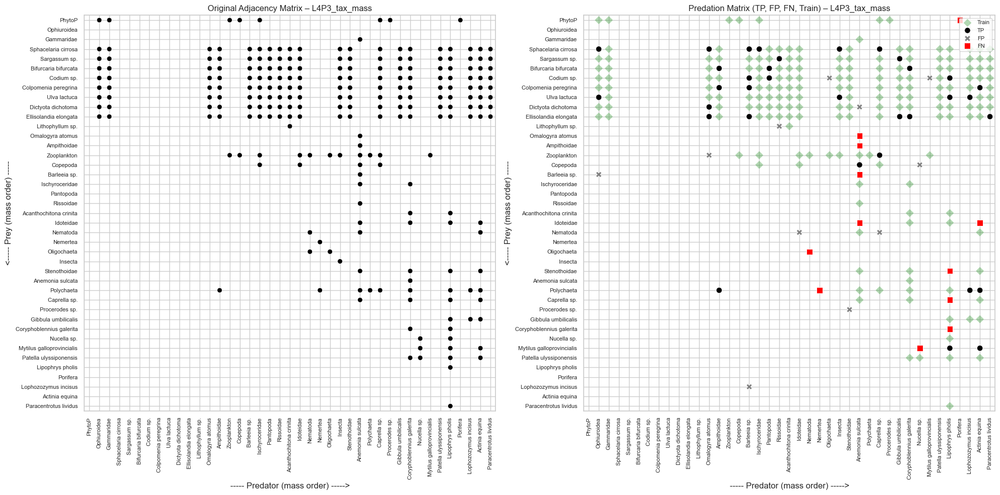


=== Processing: L2P1_tax_mass ===


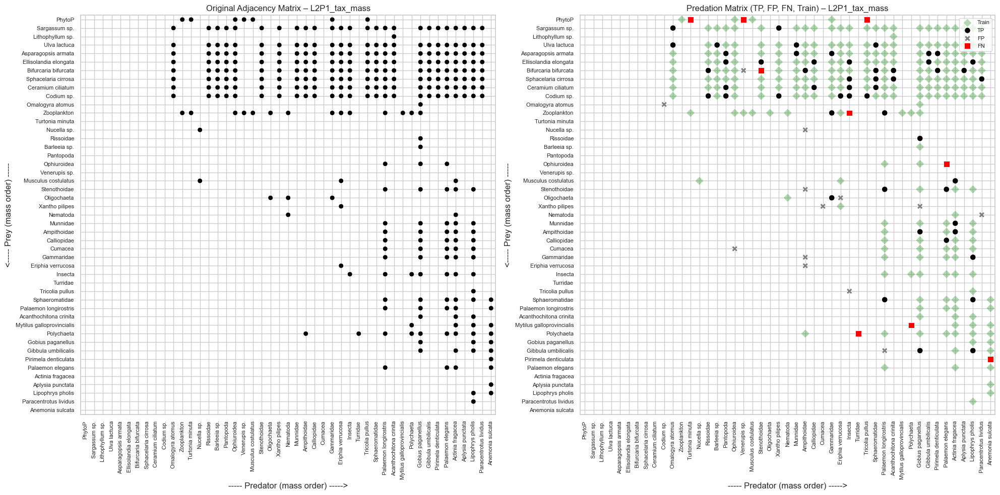


=== Processing: L3P3_tax_mass ===


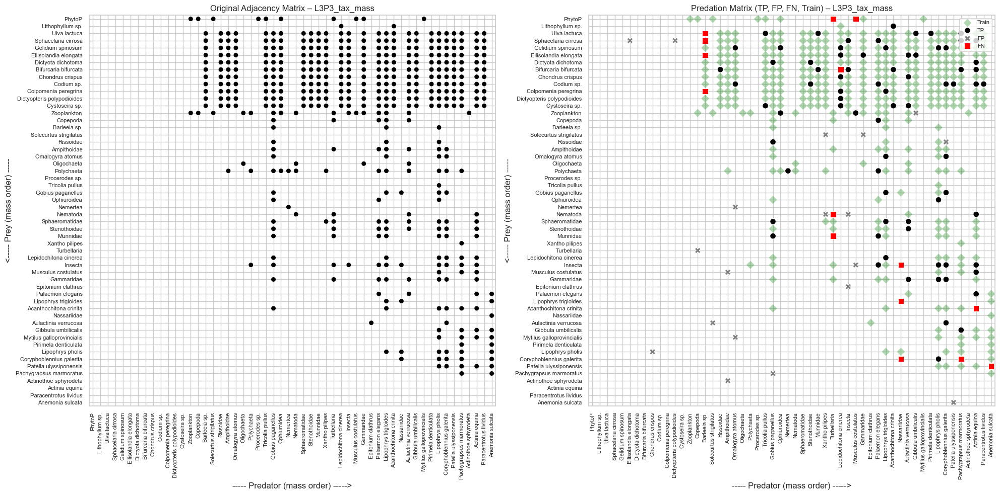


=== Processing: German Creek_tax_mass ===


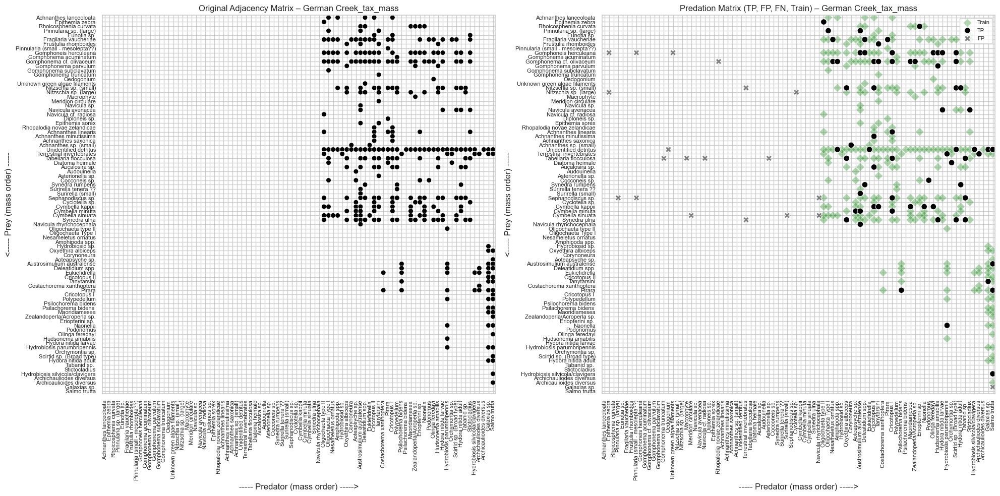


=== Processing: Ythan Estuary_tax_mass ===


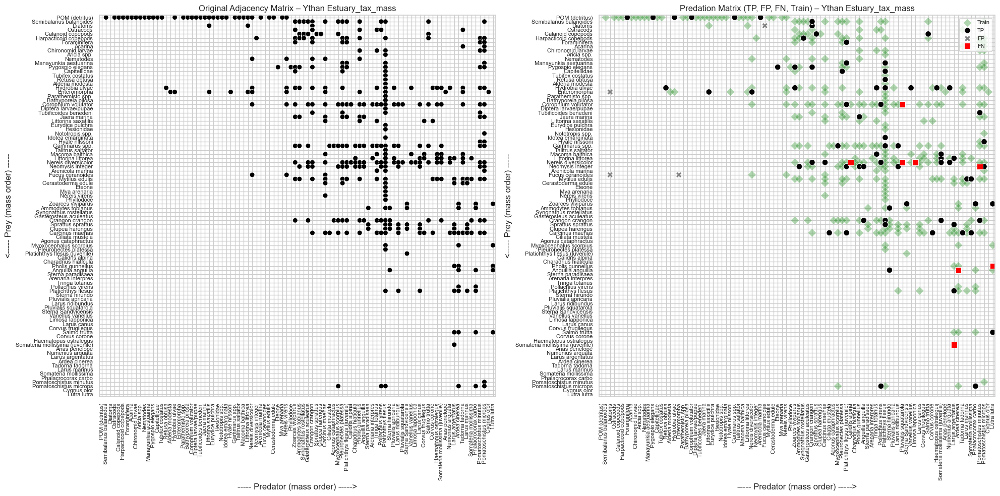


=== Processing: Broad Stream_tax_mass ===


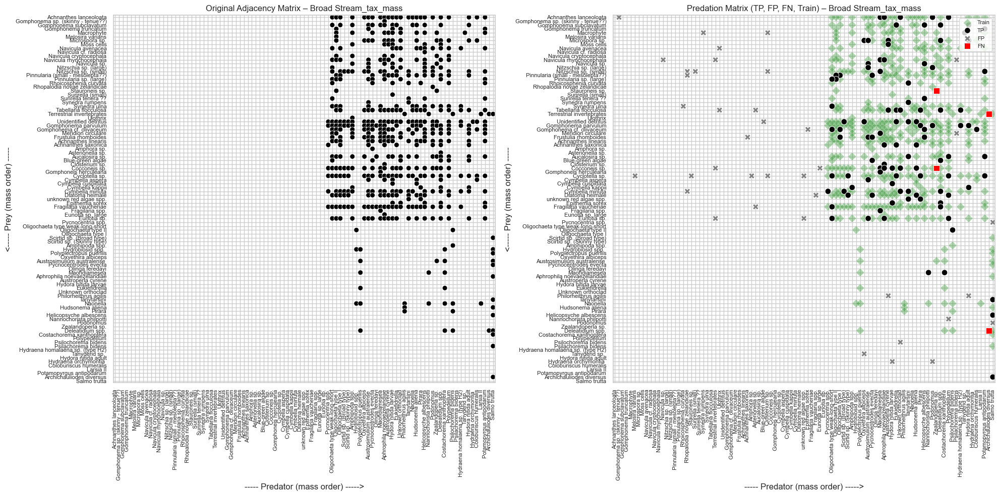


=== Processing: Chilean Intertidal El Quisco_tax_mass ===


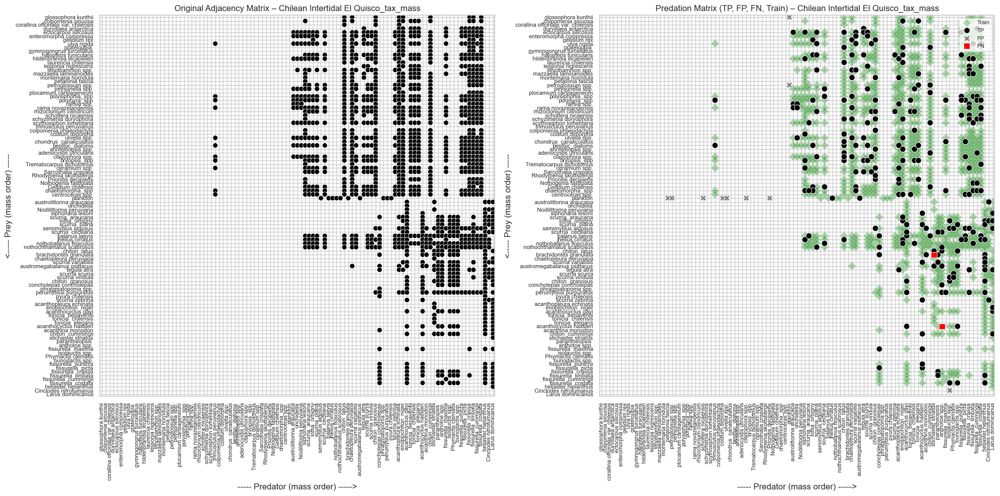


=== Processing: SEW01_tax_mass ===


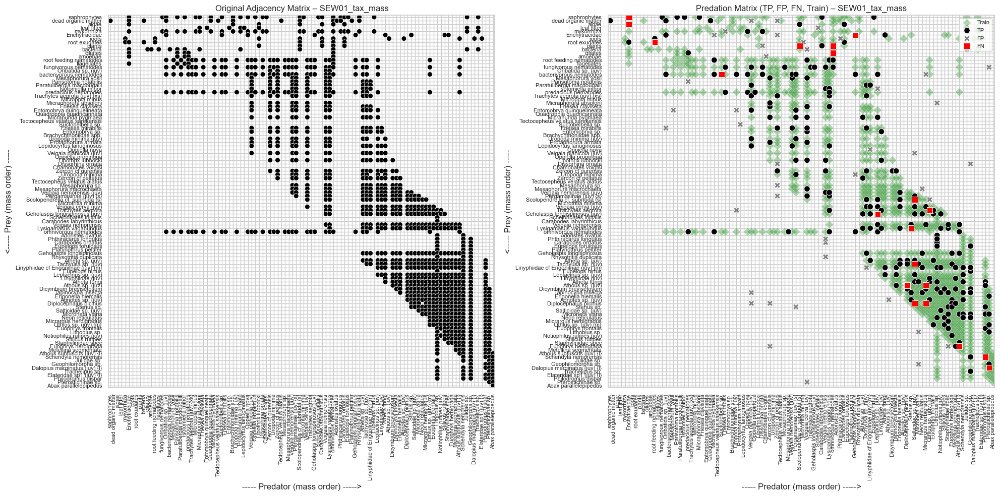


=== Processing: Chilean Intertidal Los Molles_tax_mass ===


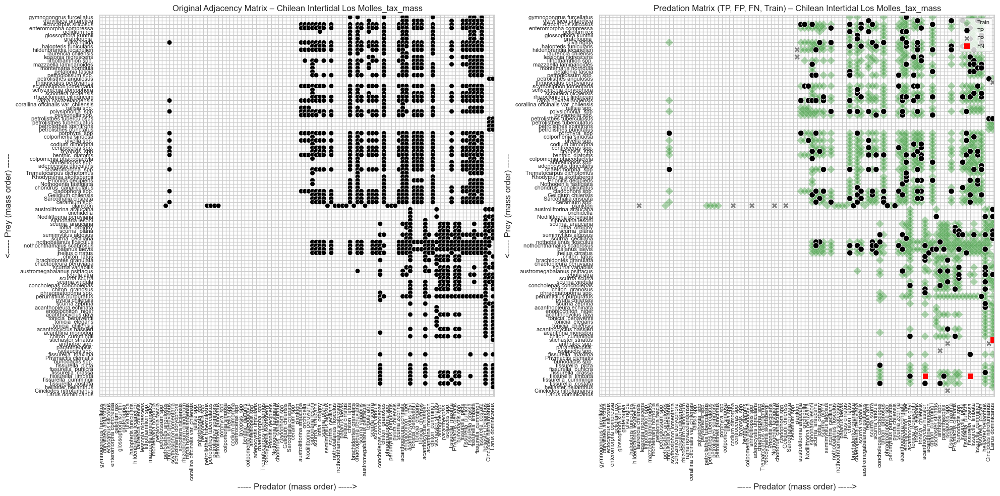


=== Processing: Dempsters Stream_tax_mass ===


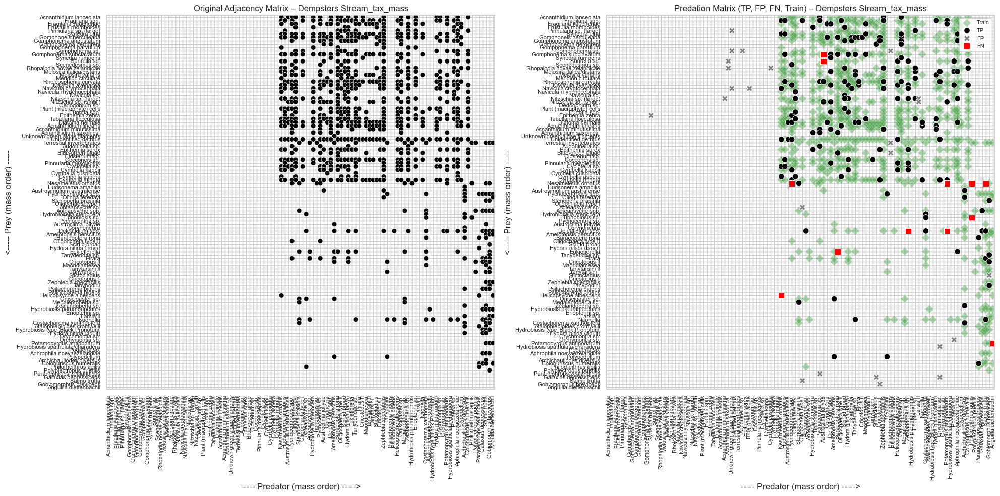


=== Processing: Gearagh_tax_mass ===


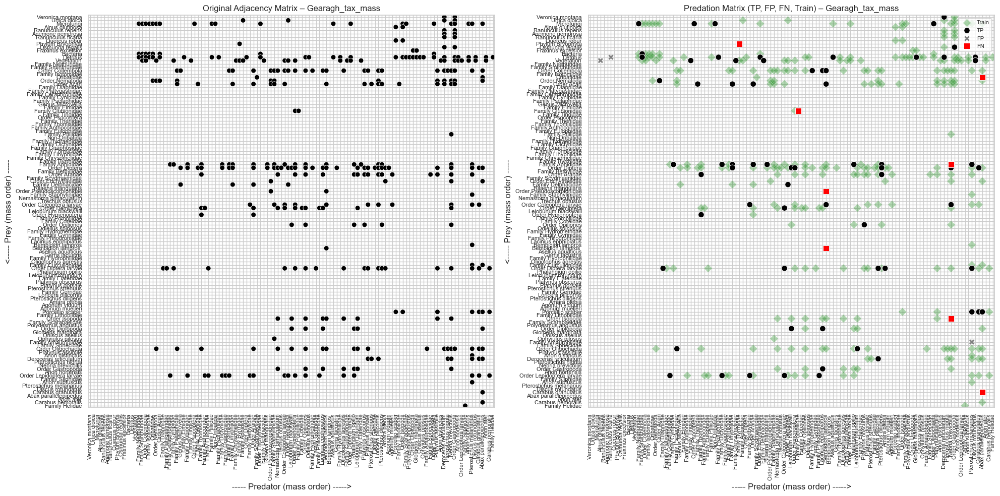


=== Processing: SEW03_tax_mass ===


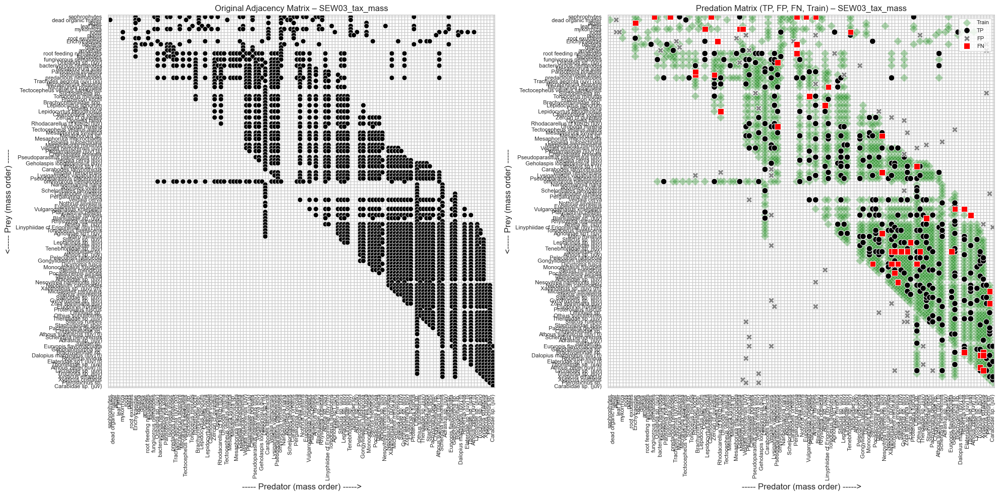


=== Processing: AEW03_tax_mass ===


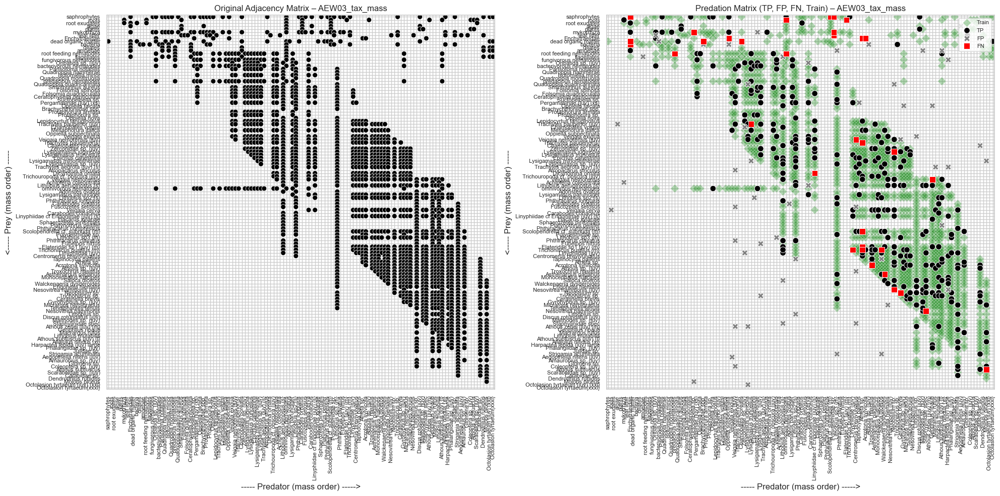


=== Processing: AEW17_tax_mass ===


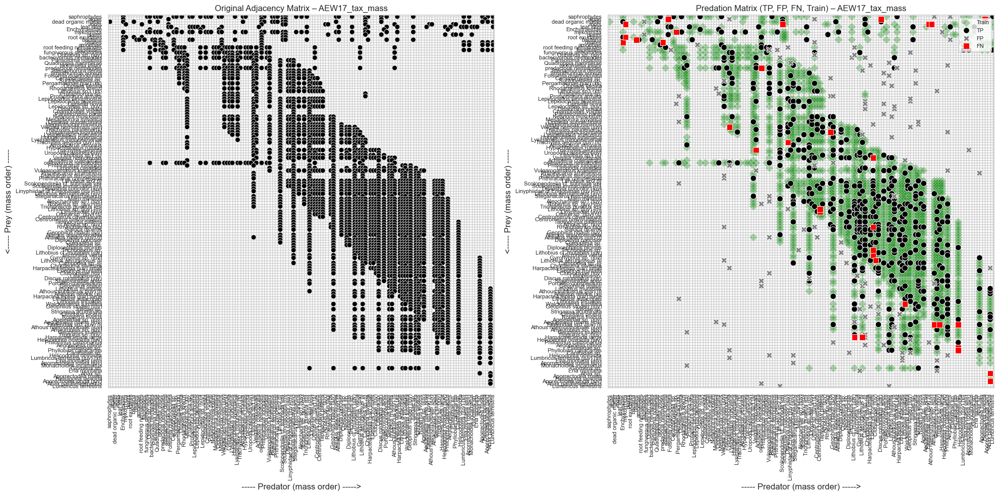


=== Processing: Grand Caricaie  marsh dominated by Cladietum marisci, mown  Clmown1_tax_mass ===


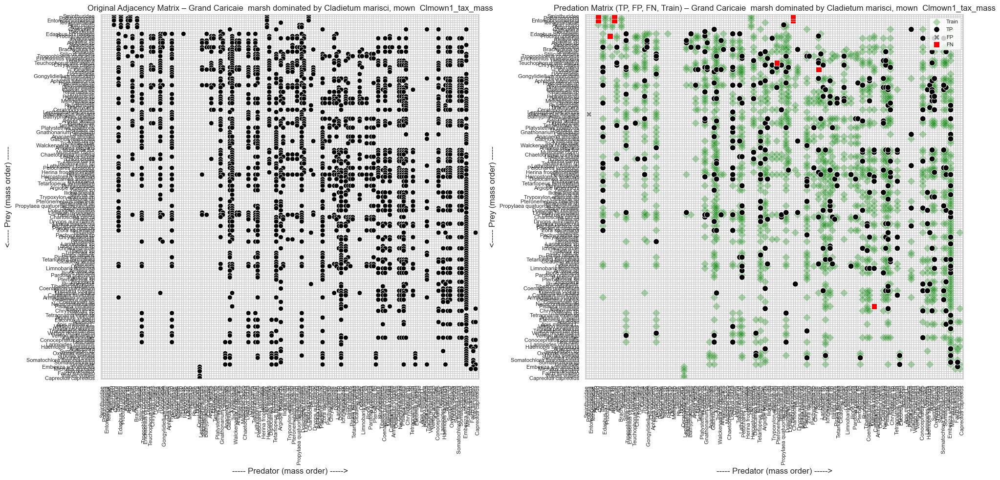

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.io
from scipy.sparse import coo_matrix, csr_matrix
import os

# Apply seaborn style
sns.set_theme(style="whitegrid", font_scale=1.0)

# === Load foodweb names list ===
foodwebs_list_df = pd.read_csv("../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv")

# === Base paths ===
base_csv_path = "../../src/matlab/data/result/confusion_matrix_csv"
base_mat_path = "../../src/matlab/data/foodwebs_mat"

# === Iterate over each foodweb ===
for foodweb in foodwebs_list_df["Foodweb"]:
    print(f"\n=== Processing: {foodweb} ===")

    try:
        # === Load CSV prediction results ===
        tp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_TP_links.csv")
        fp_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_FP_links.csv")
        fn_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_FN_links.csv")
        train_file = os.path.join(base_csv_path, f"{foodweb}_K_10_random_train_links.csv")
        mat_file = os.path.join(base_mat_path, f"{foodweb}.mat")

        tp = pd.read_csv(tp_file).dropna(subset=['Prey', 'Predator'])
        fp = pd.read_csv(fp_file).dropna(subset=['Prey', 'Predator'])
        fn = pd.read_csv(fn_file).dropna(subset=['Prey', 'Predator'])

        # === Load .mat adjacency and metadata ===
        mat_data = scipy.io.loadmat(mat_file)
        net = mat_data['net']
        taxonomy = [str(t[0]) if isinstance(t, (list, np.ndarray)) else str(t) for t in mat_data['taxonomy'].flatten()]
        mass = mat_data['mass'].flatten()

        # === Sort species by mass ===
        taxonomy_df = pd.DataFrame({'Species': taxonomy, 'Mass': mass})
        taxonomy_df = taxonomy_df.dropna().sort_values(by='Mass').reset_index(drop=True)
        sorted_species = taxonomy_df['Species'].tolist()
        species_index = {name: i for i, name in enumerate(sorted_species)}
        N = len(sorted_species)
        sorted_species_reversed = sorted_species[::-1]

        # === Sort adjacency matrix by mass ===
        if isinstance(net, coo_matrix):
            net = net.tocsr()
        elif isinstance(net, (np.ndarray, list)):
            net = csr_matrix(net)
        idx_sorted = [taxonomy.index(sp) for sp in sorted_species]
        adj_sorted = net[np.ix_(idx_sorted, idx_sorted)].toarray().astype(float)

        # === Build DataFrame for Adjacency Matrix (non-zero links) ===
        am_rows, am_cols = np.where(adj_sorted == 1)
        df_am = pd.DataFrame({
            'PreyIdx': N - 1 - am_rows,  # flip y-axis
            'PredIdx': am_cols,
            'Label': 'Link'
        })

        # === Filter predictions to valid species ===
        tp = tp[tp['Prey'].isin(species_index) & tp['Predator'].isin(species_index)]
        fp = fp[fp['Prey'].isin(species_index) & fp['Predator'].isin(species_index)]
        fn = fn[fn['Prey'].isin(species_index) & fn['Predator'].isin(species_index)]

        # === Build DataFrame for Predation Matrix
        def make_df(df, label):
            return pd.DataFrame({
                'PreyIdx': df['Prey'].map(species_index),
                'PredIdx': df['Predator'].map(species_index),
                'Label': label
            })

        df_pm = pd.concat([
            make_df(tp, 'TP'),
            make_df(fp, 'FP'),
            make_df(fn, 'FN')
        ]).dropna().astype({'PreyIdx': int, 'PredIdx': int})
        df_pm['PreyIdx'] = N - 1 - df_pm['PreyIdx']

        # === Load Training Links (if available)
        df_train = None
        if os.path.isfile(train_file):
            train = pd.read_csv(train_file).dropna(subset=['Prey', 'Predator'])
            train = train[train['Prey'].isin(species_index) & train['Predator'].isin(species_index)]
            df_train = pd.DataFrame({
                'PreyIdx': train['Prey'].map(species_index),
                'PredIdx': train['Predator'].map(species_index),
                'Label': 'Train'
            })
            df_train['PreyIdx'] = N - 1 - df_train['PreyIdx']

        # === Plotting
        fig, axs = plt.subplots(1, 2, figsize=(20, 10))

        # LEFT: Adjacency Matrix
        sns.scatterplot(data=df_am, x='PredIdx', y='PreyIdx', hue='Label', style='Label',
                        markers={'Link': 'o'}, palette={'Link': 'black'}, s=50, ax=axs[0])
        axs[0].set_title(f"Original Adjacency Matrix – {foodweb}", fontsize=12)
        axs[0].set_xticks(range(N))
        axs[0].set_yticks(range(N))
        axs[0].set_xticklabels(sorted_species, rotation=90, fontsize=8)
        axs[0].set_yticklabels(sorted_species_reversed, fontsize=8)
        axs[0].set_xlabel("----- Predator (mass order) ----->")
        axs[0].set_ylabel("<----- Prey (mass order) -----")
        axs[0].invert_yaxis()
        axs[0].set_xlim(-0.5, N - 0.5)
        axs[0].set_ylim(-0.5, N - 0.5)
        axs[0].legend([], [], frameon=False)

        # RIGHT: Predation Matrix
        ax = axs[1]
        ax.set_title(f"Predation Matrix (TP, FP, FN, Train) – {foodweb}", fontsize=12)
        ax.set_xticks(range(N))
        ax.set_yticks(range(N))
        ax.set_xticklabels(sorted_species, rotation=90, fontsize=8)
        ax.set_yticklabels(sorted_species_reversed, fontsize=8)
        ax.set_xlabel("----- Predator (mass order) ----->")
        ax.set_ylabel("<----- Prey (mass order) -----")
        ax.invert_yaxis()
        ax.set_xlim(-0.5, N - 0.5)
        ax.set_ylim(-0.5, N - 0.5)

        # Plot training links first (background), with low opacity and include in legend
        if df_train is not None:
            sns.scatterplot(data=df_train, x='PredIdx', y='PreyIdx', hue='Label', style='Label',
                            markers={'Train': 'D'}, palette={'Train': 'green'},
                            alpha=0.3, s=70, legend='brief', ax=ax)

        # Plot TP, FP, FN
        sns.scatterplot(data=df_pm, x='PredIdx', y='PreyIdx', hue='Label', style='Label',
                        markers={'TP': 'o', 'FP': 'X', 'FN': 's', 'Train': 'D'},
                        palette={'TP': 'black', 'FP': 'gray', 'FN': 'red', 'Train': 'green'},
                        s=70, ax=ax)

        ax.legend(loc='upper right', fontsize=8, title="")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Skipping {foodweb} due to error: {e}")


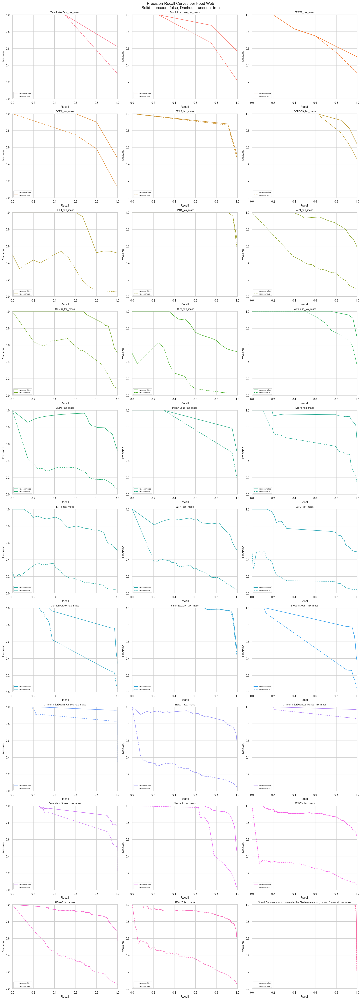

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
import os

# === Config ===
sns.set_theme(style="whitegrid", font_scale=0.9)
foodwebs_csv = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv"
false_base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-false/confusion_matrix_csv"
true_base_path = "../../src/matlab/data/result_evaluate_on_all_unseen-true/confusion_matrix_csv"

# === Load foodweb list ===
foodwebs_df = pd.read_csv(foodwebs_csv)
foodwebs = foodwebs_df["Foodweb"].tolist()

# === Grid config ===
n_cols = 3
n_rows = min((len(foodwebs) + n_cols - 1) // n_cols, 10)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows), constrained_layout=True)
axes = axes.flatten()

# === Generate a unique color for each subplot
colors = sns.color_palette("husl", len(foodwebs))

# === Plot each foodweb
for idx, foodweb in enumerate(foodwebs[:n_cols * n_rows]):
    ax = axes[idx]
    color = colors[idx]
    try:
        # Plot evaluate_on_all_unseen=false (solid line)
        file_false = os.path.join(false_base_path, f"{foodweb}_K_10_random_scores_labels_evaluate_on_all_unseen-false.csv")
        df_false = pd.read_csv(file_false)
        prec_f, rec_f, _ = precision_recall_curve(df_false["Label"], df_false["Score"])
        sns.lineplot(x=rec_f, y=prec_f, ax=ax, color=color, linewidth=1.5, errorbar=None, label='unseen=false')

        # Plot evaluate_on_all_unseen=true (dashed line)
        file_true = os.path.join(true_base_path, f"{foodweb}_K_10_random_scores_labels_evaluate_on_all_unseen-true.csv")
        if os.path.isfile(file_true):
            df_true = pd.read_csv(file_true)
            prec_t, rec_t, _ = precision_recall_curve(df_true["Label"], df_true["Score"])
            sns.lineplot(x=rec_t, y=prec_t, ax=ax, color=color, linewidth=1.5, linestyle='--', errorbar=None, label='unseen=true')

        ax.set_title(foodweb, fontsize=9)
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_xlabel("Recall")
        ax.set_ylabel("Precision")
        ax.legend(loc='lower left', fontsize=7)

    except Exception as e:
        ax.set_title(f"{foodweb} (Error)")
        print(f"Skipping {foodweb}: {e}")

# === Remove extra subplots
for j in range(len(foodwebs), n_rows * n_cols):
    fig.delaxes(axes[j])

plt.suptitle("Precision-Recall Curves per Food Web\nSolid = unseen=false, Dashed = unseen=true", fontsize=14)
plt.show()


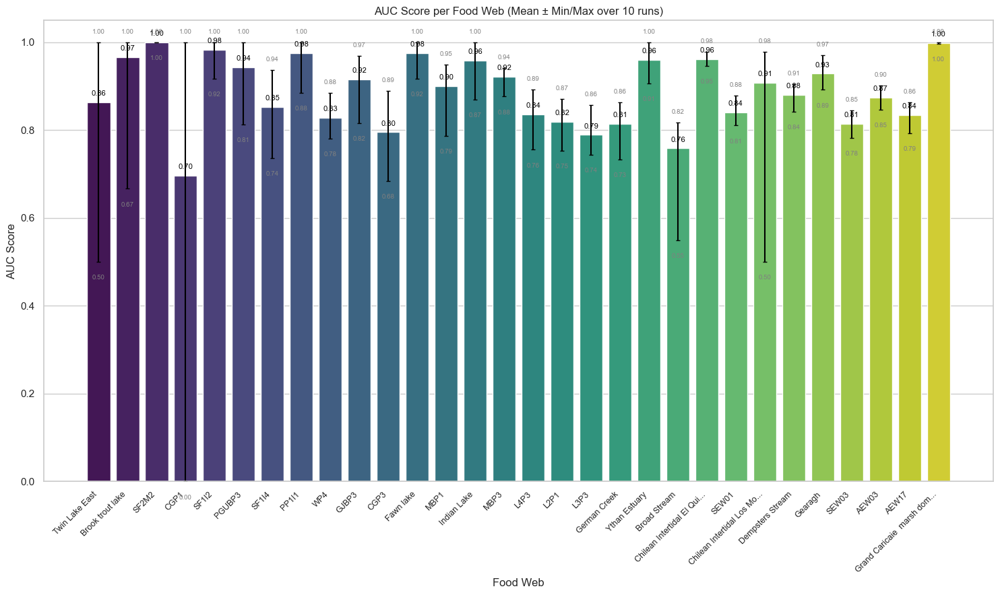

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# === Config ===
sns.set_theme(style="whitegrid", font_scale=1.0)
foodwebs_csv = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv"
results_base_path = "../../src/matlab/data/result/prediction_scores_logs"
metric = "Precision"

# === Load foodweb metadata
foodwebs_df = pd.read_csv(foodwebs_csv)
foodwebs_df["Foodweb_clean"] = foodwebs_df["Foodweb"].str.replace("_tax_mass", "", regex=False)

# Identify correct node count column
node_count_column = "Nodes" if "Nodes" in foodwebs_df.columns else foodwebs_df.columns[-1]
foodwebs_df = foodwebs_df[["Foodweb", "Foodweb_clean", node_count_column]].rename(columns={node_count_column: "N"})

# === Collect metrics
summary_list = []
for _, row in foodwebs_df.iterrows():
    foodweb = row["Foodweb"]
    clean_name = row["Foodweb_clean"]
    n_nodes = row["N"]

    result_file = os.path.join(results_base_path, f"{foodweb}_results_random.csv")
    if not os.path.isfile(result_file):
        continue

    try:
        df = pd.read_csv(result_file)
        if metric not in df.columns:
            continue

        summary_list.append({
            "Foodweb": foodweb,
            "Foodweb_clean": clean_name,
            "Foodweb_short": clean_name[:25] + "..." if len(clean_name) > 25 else clean_name,
            "N": n_nodes,
            "AUC_mean": df[metric].mean(),
            "AUC_min": df[metric].min(),
            "AUC_max": df[metric].max()
        })
    except:
        continue

# === To DataFrame and sort by N
summary_df = pd.DataFrame(summary_list).sort_values(by="N")

# === Plot
plt.figure(figsize=(15, 9))
ax = sns.barplot(
    data=summary_df,
    x="Foodweb_short", y="AUC_mean",
    hue="Foodweb_short",  # this resolves the Seaborn warning
    palette="viridis",
    legend=False
)

# Plot min/max error bars and value labels
for i, row in summary_df.iterrows():
    y_mean = row["AUC_mean"]
    y_min = row["AUC_min"]
    y_max = row["AUC_max"]
    ax.errorbar(x=i, y=y_mean, yerr=[[y_mean - y_min], [y_max - y_mean]], fmt='none', color='black', capsize=2)
    ax.text(i, y_mean + 0.015, f'{y_mean:.2f}', ha='center', fontsize=8, color='black')
    ax.text(i, y_min - 0.04, f'{y_min:.2f}', ha='center', fontsize=7, color='gray')
    ax.text(i, y_max + 0.02, f'{y_max:.2f}', ha='center', fontsize=7, color='gray')

# Final layout
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.ylabel("AUC Score")
plt.xlabel("Food Web")
plt.title("AUC Score per Food Web (Mean ± Min/Max over 10 runs)")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()


In [2]:
import os
import pandas as pd
import scipy.io
import numpy as np

# === Paths ===
foodwebs_csv = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv"
confusion_matrix_path = "../../src/matlab/data/result/confusion_matrix_csv"
mat_path = "../../src/matlab/data/foodwebs_mat"
output_path = "../../src/matlab/data/result/fp_prone_species_summaries"

# === Ensure output directory exists ===
os.makedirs(output_path, exist_ok=True)

# === Load list of foodwebs ===
foodwebs_df = pd.read_csv(foodwebs_csv)
foodwebs = foodwebs_df["Foodweb"].tolist()

# === Loop over foodwebs ===
for foodweb in foodwebs:
    try:
        # === Build file paths ===
        csv_fp = os.path.join(confusion_matrix_path, f"{foodweb}_K_10_random_FP_links.csv")
        mat_file = os.path.join(mat_path, f"{foodweb}.mat")
        output_csv = os.path.join(output_path, f"{foodweb}_fp_prone_species_summary.csv")

        # Skip if FP CSV or MAT missing
        if not os.path.isfile(csv_fp) or not os.path.isfile(mat_file):
            print(f"Skipping {foodweb}: missing files")
            continue

        # === Load FP CSV and count FP per species ===
        fp_df = pd.read_csv(csv_fp)
        fp_predators = fp_df['Predator'].value_counts().rename("FP_as_Predator")
        fp_prey = fp_df['Prey'].value_counts().rename("FP_as_Prey")
        fp_species_stats = pd.concat([fp_predators, fp_prey], axis=1).fillna(0)
        fp_species_stats["FP_total"] = fp_species_stats["FP_as_Predator"] + fp_species_stats["FP_as_Prey"]
        fp_species_stats.index.name = "Species"
        fp_species_stats = fp_species_stats.reset_index()

        # === Load taxonomy and mass from .mat ===
        mat_data = scipy.io.loadmat(mat_file)
        taxonomy = mat_data["taxonomy"].flatten()
        mass = mat_data["mass"].flatten()

        taxonomy_cleaned = []
        for item in taxonomy:
            if isinstance(item, np.ndarray):
                taxonomy_cleaned.append(str(item[0]))
            else:
                taxonomy_cleaned.append(str(item))

        traits_df = pd.DataFrame({
            "Species": taxonomy_cleaned,
            "Mass": mass
        })

        # === Merge FP stats with species traits ===
        summary_df = pd.merge(fp_species_stats, traits_df, on="Species", how="left")
        summary_df = summary_df.sort_values(by="FP_total", ascending=False)

        # === Save output
        summary_df.to_csv(output_csv, index=False)
        print(f"Saved: {output_csv}")

    except Exception as e:
        print(f"Error processing {foodweb}: {e}")

Saved: ../../src/matlab/data/result/fp_prone_species_summaries/Twin Lake East_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/Brook trout lake_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/SF2M2_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/CGP1_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/SF1I2_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/PGUBP3_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/SF1I4_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/PP1I1_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/matlab/data/result/fp_prone_species_summaries/WP4_tax_mass_fp_prone_species_summary.csv
Saved: ../../src/ma

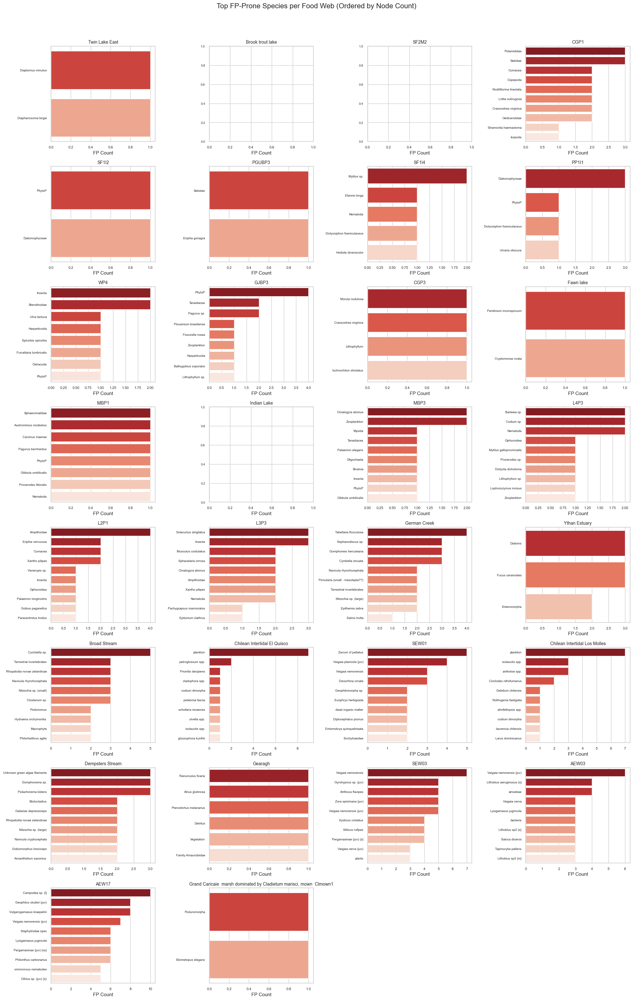

In [9]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Config ===
sns.set_theme(style="whitegrid", font_scale=0.9)

summary_dir = "../../src/matlab/data/result/fp_prone_species_summaries"
metrics_path = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv"

# === Load foodwebs and sort by node count ===
metrics_df = pd.read_csv(metrics_path)
metrics_df["Foodweb_full"] = metrics_df["Foodweb"]
metrics_df["Foodweb"] = metrics_df["Foodweb"].str.replace("_tax_mass", "", regex=False)
foodweb_order = metrics_df.sort_values("Nodes")["Foodweb"].tolist()

# === Get all summary files and map by cleaned foodweb name ===
all_summaries = [
    f for f in os.listdir(summary_dir)
    if f.endswith("_fp_prone_species_summary.csv")
]

summary_map = {
    f.replace("_fp_prone_species_summary.csv", "").replace("_tax_mass", ""): f
    for f in all_summaries
}

# === Match foodwebs to summary files in the sorted order
ordered_files = [summary_map[fw] for fw in foodweb_order if fw in summary_map]

# === Skip if no files found
if not ordered_files:
    raise RuntimeError("No matching FP summary CSVs found.")

# === Plot config
n_cols = 4
n_rows = (len(ordered_files) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

# === Plot each
for idx, file in enumerate(ordered_files):
    ax = axes[idx]
    df = pd.read_csv(os.path.join(summary_dir, file))
    df["FP_total"] = pd.to_numeric(df["FP_total"], errors="coerce").fillna(0)

    top_fp = df.nlargest(10, "FP_total")
    foodweb_label = file.replace("_fp_prone_species_summary.csv", "").replace("_tax_mass", "")

    sns.barplot(data=top_fp, x="FP_total", y="Species", hue="Species", palette="Reds_r", legend=False, ax=ax)
    ax.set_title(foodweb_label, fontsize=10)
    ax.set_xlabel("FP Count")
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=7)

# === Hide extra axes
for j in range(len(ordered_files), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Top FP-Prone Species per Food Web (Ordered by Node Count)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

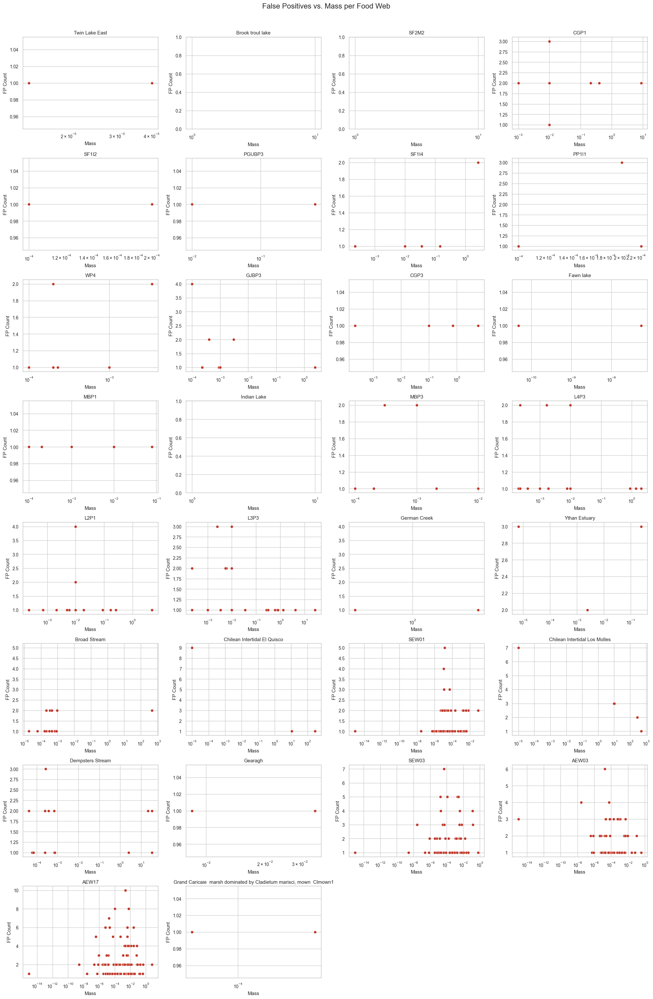

In [11]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Config ===
summary_dir = "../../src/matlab/data/result/fp_prone_species_summaries"
metrics_path = "../../src/matlab/data/foodwebs_mat/foodweb_metrics_small.csv"

# === Load foodweb order by number of nodes (ascending)
metrics_df = pd.read_csv(metrics_path)
metrics_df["Foodweb"] = metrics_df["Foodweb"].str.replace("_tax_mass", "", regex=False)
foodweb_order = metrics_df.sort_values("Nodes")["Foodweb"].tolist()

# === Available summaries
summary_files = {
    f.replace("_fp_prone_species_summary.csv", "").replace("_tax_mass", ""): f
    for f in os.listdir(summary_dir) if f.endswith("_fp_prone_species_summary.csv")
}

# === Match summaries to foodweb order
ordered_files = [summary_files[fw] for fw in foodweb_order if fw in summary_files]

# === Grid layout
n_cols = 4
n_rows = (len(ordered_files) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

# === Plot each scatter
for idx, file in enumerate(ordered_files):
    ax = axes[idx]
    df = pd.read_csv(os.path.join(summary_dir, file))

    # Ensure numeric types
    df["FP_total"] = pd.to_numeric(df["FP_total"], errors="coerce")
    df["Mass"] = pd.to_numeric(df["Mass"], errors="coerce")

    sns.scatterplot(data=df, x="Mass", y="FP_total", ax=ax, color="#c0392b")  # dark red

    foodweb_name = file.replace("_fp_prone_species_summary.csv", "").replace("_tax_mass", "")
    ax.set_title(foodweb_name)
    ax.set_xlabel("Mass")
    ax.set_ylabel("FP Count")
    ax.set_xscale("log")
    ax.grid(True)

# === Remove unused axes
for j in range(len(ordered_files), len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("False Positives vs. Mass per Food Web", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

### This plot helps visualize whether certain traits like small body mass are associated with higher rates of false positive predictions.

###  If most dots are clustered in the lower mass range with higher FP counts:

## This suggests that small-bodied species may be more error-prone in the model's predictions—potentially due to limited data, ecological generalism, or underrepresentation in training links.